# Exploratory Data Analysis

In [1]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from altair import *
from ipywidgets import interact, interact_manual, interactive, fixed
from IPython.display import display

In [2]:
work_dir = './data/kpatel28/'
using_year = '2016'
raw_file_path = work_dir + using_year + '-nfl-all.csv'
penalty_file_path = work_dir + using_year + '-nfl-penalties.csv'
other_file_path = work_dir + using_year + '-nfl-other.csv'
plays_file_path = work_dir + using_year + '-nfl-plays.csv'

* NFL plays data explored through transformations and visualization
* Relationships between different parts of the data set are explored
* Questions about the 2016 NFL season are explored, such as:
    * What plays, formations, and passes are most associated with yard gains?
    * What factors affect yard gains in a play?
    * How does the game clock and quarter affect the touchdown rate?

### NFL Plays Table

In [3]:
plays = pd.read_csv(plays_file_path)
print('Columns:', ', '.join(plays.columns))
plays.head()

Columns: GameId, GameDate, Quarter, Minute, Second, OffenseTeam, DefenseTeam, Down, ToGo, YardLine, SeriesFirstDown, Description, Yards, Formation, PlayType, IsRush, IsPass, IsCompleted, IsTouchdown, PassType, IsSack, IsChallenge, IsChallengeReversed, IsInterception, IsFumble, RushDirection, YardLineFixed, YardLineDirection


,GameId,GameDate,Quarter,Minute,Second,OffenseTeam,DefenseTeam,Down,ToGo,YardLine,...,IsTouchdown,PassType,IsSack,IsChallenge,IsChallengeReversed,IsInterception,IsFumble,RushDirection,YardLineFixed,YardLineDirection
0,2016091102,2016-09-11,3,13,9,HOU,CHI,1,15,85,...,0,SHORT LEFT,0,0,0,0,0,NOT APPLICABLE,15,OPP
1,2016091105,2016-09-11,2,1,32,NO,OAK,2,10,47,...,0,SHORT RIGHT,0,0,0,0,0,NOT APPLICABLE,47,OWN
2,2016091105,2016-09-11,2,1,26,NO,OAK,3,4,53,...,0,DEEP LEFT,0,0,0,0,0,NOT APPLICABLE,47,OPP
3,2016091105,2016-09-11,2,1,20,NO,OAK,4,9,48,...,0,NOT APPLICABLE,0,0,0,0,0,NOT APPLICABLE,48,OWN
4,2016091105,2016-09-11,2,1,11,OAK,NO,1,10,18,...,0,SHORT MIDDLE,0,0,0,0,0,NOT APPLICABLE,18,OWN


### General Plays, Downs, Yardage, and Yard Lines

As expected, most of the plays are passes and rushes:

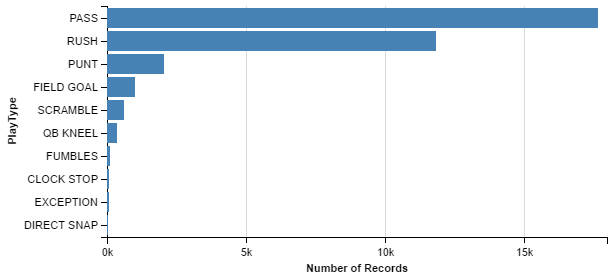

In [4]:
Chart(plays[plays['PlayType']!='SACK'][['PlayType']]).mark_bar().encode(
    x=X('count(*):Q'),
    y=Y('PlayType:N', sort=SortField(field='PlayType', order='descending', op='count')),
)

And the types of plays with the highest average yardage are passes, scrambles, and rushes:

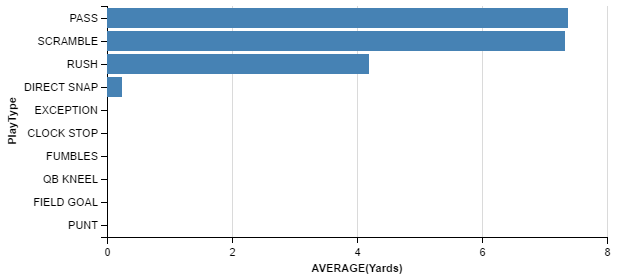

In [5]:
Chart(plays[plays['PlayType']!='SACK'][['PlayType', 'Yards']]).mark_bar().encode(
    x=X('average(Yards):Q'),
    y=Y('PlayType:N', sort=SortField(field='Yards', order='descending', op='mean')),
)

The following groupby of playtype and yardline direction confirms things we would expect. (ie all field goals happen past the 50 yard line, punting is much more common when the team is over 50 yards from the endzone).

In [6]:
plays.groupby(['YardLineDirection', 'PlayType'])[['PlayType']].count()

PlayType
YardLineDirection PlayType             
OPP               CLOCK STOP         54
                  DIRECT SNAP        18
                  EXCEPTION          23
                  FIELD GOAL        991
                  FUMBLES            45
                  PASS             7652
                  PUNT              359
                  QB KNEEL          169
                  RUSH             5161
                  SACK              405
                  SCRAMBLE          260
OWN               CLOCK STOP         14
                  DIRECT SNAP        23
                  EXCEPTION          39
                  FUMBLES            47
                  PASS            10023
                  PUNT             1701
                  QB KNEEL          204
                  RUSH             6700
                  SACK              659
                  SCRAMBLE          342

The following groupby shows that passing and rushing is less common as the down count increases (as expected punting is the most common play in the fourth down):

In [7]:
plays.groupby(['Down', 'PlayType'])[['PlayType']].count()

PlayType
Down PlayType             
1    CLOCK STOP         51
     DIRECT SNAP        23
     EXCEPTION          33
     FIELD GOAL         26
     FUMBLES            38
     PASS             6770
     QB KNEEL          233
     RUSH             6670
     SACK              319
     SCRAMBLE          202
2    CLOCK STOP         12
     DIRECT SNAP        15
     EXCEPTION          19
     FIELD GOAL         35
     FUMBLES            33
     PASS             5884
     QB KNEEL           91
     RUSH             4048
     SACK              300
     SCRAMBLE          187
3    CLOCK STOP          5
     DIRECT SNAP         2
     EXCEPTION           8
     FIELD GOAL         20
     FUMBLES            14
     PASS             4739
     QB KNEEL           48
     RUSH             1009
     SACK              433
     SCRAMBLE          202
4    DIRECT SNAP         1
     EXCEPTION           2
     FIELD GOAL        910
     FUMBLES             7
     PASS              282
     PUNT             2060
     QB KNEEL            1
     RUSH              134
     SACK               12
     SCRAMBLE           11

Consequently, the average yardage in the first three downs is high and that of the fourth down is low. Also, yards are more easily gained when the offense is further from their goal endzone:

In [8]:
plays.groupby(['YardLineDirection', 'Down'])[['Yards']].mean()

Yards
YardLineDirection Down          
OPP               1     4.814528
                  2     4.944767
                  3     5.003428
                  4     0.998148
OWN               1     6.033262
                  2     5.976888
                  3     6.417906
                  4     0.341667

As the game progresses from the first quarter to overtime, the average yardage tends to increase. we can see that the third down of overtime has the highest average yardage (probably owing to desperation). We can also see that some teams will attept to make advancing plays during fourth down of overtime instead of punting the ball as seen by the higher average yardage of that case:

In [9]:
plays.groupby(['Quarter', 'Down'])[['Yards', 'IsCompleted']].mean()

Yards  IsCompleted
Quarter Down                       
1       1     5.538933     0.865420
        2     5.636364     0.840909
        3     5.703396     0.701317
        4     0.344966     0.995973
2       1     5.766692     0.823740
        2     5.615222     0.805497
        3     5.792788     0.714940
        4     0.319958     0.980993
3       1     5.560765     0.854719
        2     5.485202     0.818258
        3     6.290076     0.711312
        4     0.507671     0.987448
4       1     5.250000     0.828125
        2     5.367581     0.801458
        3     5.385341     0.736813
        4     1.274014     0.919110
5       1     5.553571     0.875000
        2     5.779070     0.837209
        3     7.270833     0.729167
        4     2.181818     0.954545

We can also see that the variance of average yardage increases with each passing quarter. The middle time segment of overtime shows some notable (extreme) behavior:

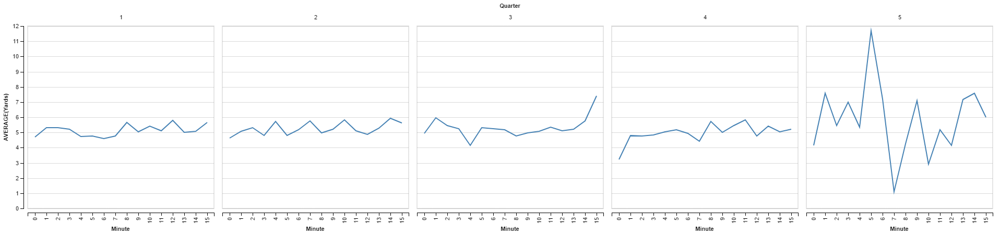

In [10]:
Chart(plays[['Quarter', 'Minute', 'Yards']]).mark_line().encode(
    x=X('Minute:O'),
    y=Y('average(Yards):Q'),
    column='Quarter'
)

Third down is the most common down for touchdowns, except in overtime where teams will attempt to advance in the fourth down:

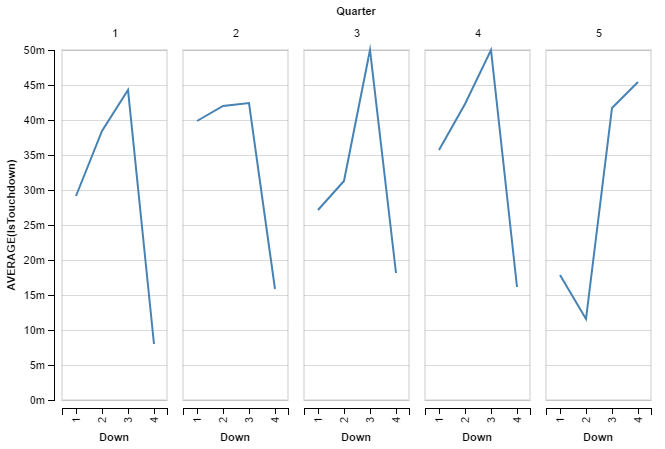

In [11]:
Chart(plays[['Down', 'Quarter', 'IsTouchdown']]).mark_line().encode(
    x=X('Down:O'),
    y=Y('average(IsTouchdown):Q'),
    column='Quarter'
)

Histogram of yard line location:

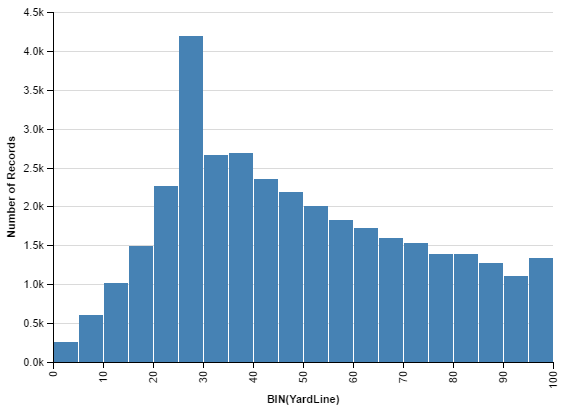

In [12]:
Chart(plays[['YardLine']]).mark_bar().encode(
    x=X('YardLine:Q', bin=Bin(maxbins=30)),
    y=Y('count(*):Q')
)

Histogram of yard line fixed location:

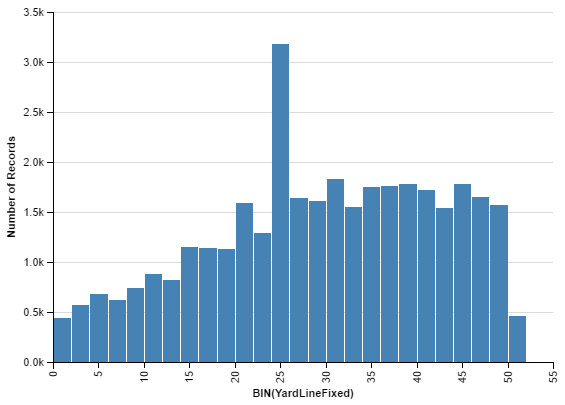

In [13]:
Chart(plays[['YardLineFixed']]).mark_bar().encode(
    x=X('YardLineFixed:Q', bin=Bin(maxbins=30)),
    y=Y('count(*):Q')
)

Histogram of yards to go:

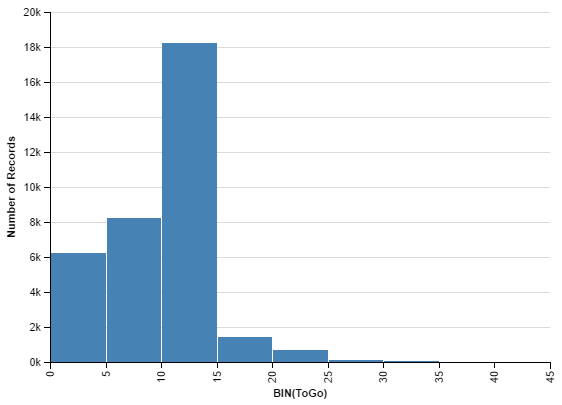

In [14]:
Chart(plays[['ToGo']]).mark_bar().encode(
    x=X('ToGo:Q', bin=Bin(maxbins=20)),
    y=Y('count(*):Q')
)

Descriptive stats for most of the non temporal columns. YardLine, YardLineFixed, and Yards are all right-skewed data:

In [15]:
plays[['YardLine', 'YardLineFixed', 'ToGo', 'Yards']].describe()

,YardLine,YardLineFixed,ToGo,Yards
count,34889.000000,34889.000000,34889.000000,34889.000000
mean,48.207143,28.973115,8.596090,5.096449
std,24.524115,12.747709,4.145631,8.645650
min,1.000000,1.000000,1.000000,-19.000000
25%,27.000000,20.000000,6.000000,0.000000
50%,44.000000,29.000000,10.000000,2.000000
75%,67.000000,40.000000,10.000000,8.000000
max,99.000000,50.000000,44.000000,100.000000


### Passing Plays

Most passes are short range to the left or right (the darker region represents the proportion of completed passes):

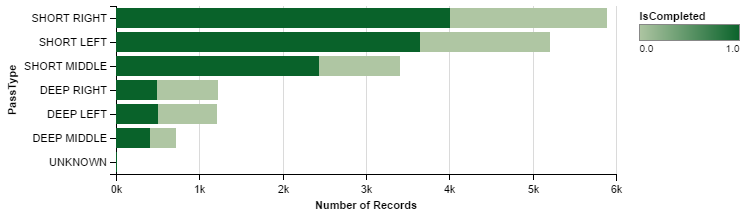

In [16]:
Chart(plays[plays['IsPass']==1][['PassType', 'IsCompleted']]).mark_bar().encode(
    x=X('count(*):Q'),
    y=Y('PassType:N', sort=SortField(field='PassType', order='descending', op='count')),
    color=Color('IsCompleted')
)

As expected, shorter passes have higher chances of completion. Interestingly passes to receivers in the middle region are more likely to be completed overall - with a significantly higher chance of success for longer distance passes:

In [17]:
plays[plays['IsPass']==1].groupby('PassType')[['IsCompleted', 'IsInterception', 'IsFumble', 'IsTouchdown', 'SeriesFirstDown', 'Yards']].mean()

,IsCompleted,IsInterception,IsFumble,IsTouchdown,SeriesFirstDown,Yards
PassType,,,,,,
DEEP LEFT,0.412541,0.047855,0.004125,0.067657,0.387789,11.093234
DEEP MIDDLE,0.571229,0.069832,0.008380,0.083799,0.526536,14.571229
DEEP RIGHT,0.406378,0.051513,0.004088,0.064595,0.381030,11.389207
SHORT LEFT,0.699022,0.011893,0.007865,0.036639,0.333014,6.252829
SHORT MIDDLE,0.715041,0.021445,0.010576,0.044653,0.408931,7.618096
SHORT RIGHT,0.680530,0.013410,0.008318,0.036836,0.317603,5.796639
UNKNOWN,0.437500,0.250000,0.125000,0.000000,0.062500,0.437500


In both the short and long distance cases, the middle region pass is less likely to happen and thus more unexpected. It is perceived as riskier because more defenders have potential access to the ball, whereas in the left or right passes only the defenders at the relevent edge have a chance. In the long distance case perceived risk is even higher because the ball is  likely to be thrown over the heads of more defenders. Defenders probably do not expect this to happen very much and so it is harder to prepare for and unexpected when it does happen. The perceived risk is somewhat warranted by the higher rate of interception and fumbling when the ball is thrown toward the middle region; in the short distance case, the interception chance is almost doubled! But we can also see that on average middle region throws yield more yards, are more likely to lead to first downs, and are more likely to lead to touchdowns.

Most pass plays are done in the shotgun formation where the ball is snapped back in a toss, so the quarterback has more distance between him and the other team's defenders (the darker region represents the proportion of pass plays):

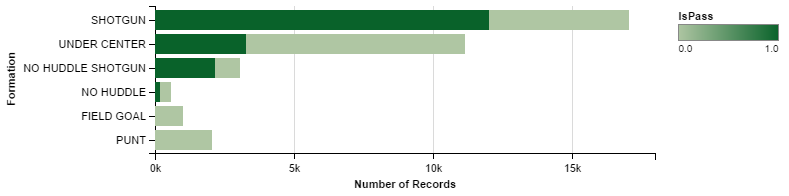

In [18]:
Chart(plays[['Formation', 'IsPass']]).mark_bar().encode(
    x=X('count(*):Q'),
    y=Y('Formation:N', sort=SortField(field='IsPass', order='descending', op='sum')),
    color=Color('IsPass'),
)

The formation used during a pass play does not tell us as much aboout the results than the type of pass, but there a few useful pieces of information that are confirmed. Under center is the formation that is most associated with first downs and touchdowns, likely because it brings the ball handler closer to the first down line or endzone. Surprisingly, under center is also associated with significantly more yardage than shotgun on average for pass plays.

In [19]:
plays[plays['IsPass']==1].groupby('Formation')[['IsCompleted', 'IsInterception', 'IsFumble', 'IsTouchdown', 'SeriesFirstDown', 'Yards']].mean()

,IsCompleted,IsInterception,IsFumble,IsTouchdown,SeriesFirstDown,Yards
Formation,,,,,,
FIELD GOAL,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
NO HUDDLE,0.736842,0.026316,0.000000,0.047368,0.494737,8.768421
NO HUDDLE SHOTGUN,0.638876,0.017043,0.008291,0.040534,0.372179,7.122064
SHOTGUN,0.649568,0.023695,0.008730,0.043648,0.345195,7.139092
UNDER CENTER,0.657534,0.018874,0.006393,0.048402,0.383257,8.369254


Average pass completion rate by team descending (darker color indicates proportion of the team's plays that were passes):

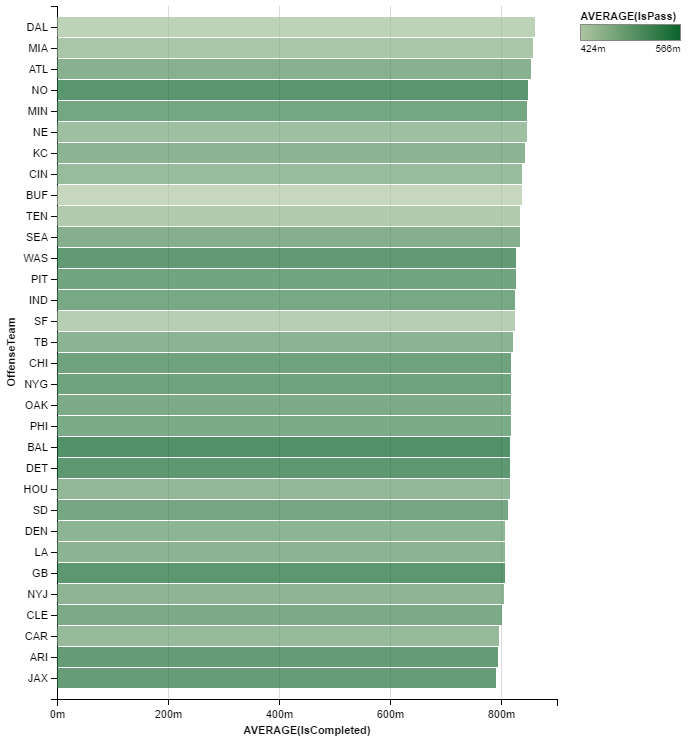

In [20]:
Chart(plays[['IsPass', 'OffenseTeam', 'IsCompleted']]).mark_bar().encode(
    x=X('average(IsCompleted):Q'),
    y=Y('OffenseTeam:N', sort=SortField(field='IsCompleted', order='descending', op='mean')),
    color='average(IsPass)'
)

### Rushing Plays

Unlike pass plays, most rushes are done in the under center formation - the ball is snapped without a throw and the QB is much closer to the defenders of the other team:

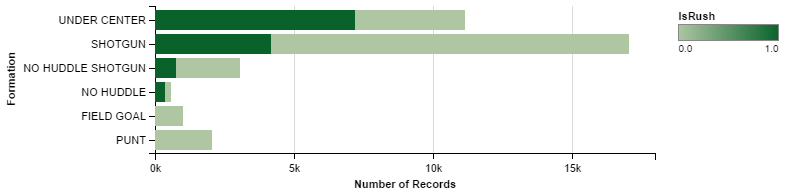

In [21]:
Chart(plays[['Formation', 'IsRush']]).mark_bar().encode(
    x=X('count(*):Q'),
    y=Y('Formation:N', sort=SortField(field='IsRush', order='descending', op='sum')),
    color=Color('IsRush'),
)

The average yardage of a rush play is much lower than that of a pass play, but there is no chance of interception and a much lower chance of fumbling. Surprisingly, the shotgun formation yields the most amount of yards on average even though it is used less than under center for rush plays: 

In [22]:
plays[plays['PlayType']=='RUSH'].groupby('Formation')[['IsTouchdown', 'IsFumble', 'SeriesFirstDown', 'Yards']].mean()

,IsTouchdown,IsFumble,SeriesFirstDown,Yards
Formation,,,,
NO HUDDLE,0.020231,0.005780,0.225434,3.436416
NO HUDDLE SHOTGUN,0.025487,0.017991,0.265367,4.010495
SHOTGUN,0.028982,0.012231,0.231056,4.621377
UNDER CENTER,0.039227,0.007761,0.221956,4.026669


Center is far and away the most common rush direction, followed by right and left guard:

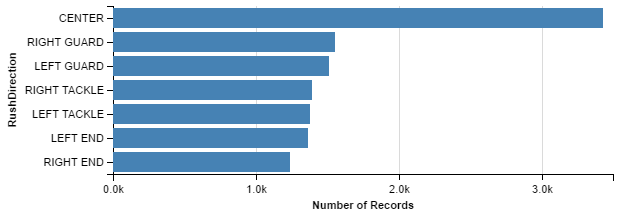

In [23]:
Chart(plays[plays['PlayType']=='RUSH'][['RushDirection']]).mark_bar().encode(
    x=X('count(*):Q'),
    y=Y('RushDirection:N', sort=SortField(field='RushDirection', order='descending', op='count'))
)

Touchdowns are associated with left guard and right end rush directions. The left end rush direction has the highest average yardage and is most associated with winning first downs:

In [24]:
plays[plays['PlayType']=='RUSH'].groupby('RushDirection')[['IsFumble', 'IsTouchdown', 'SeriesFirstDown', 'Yards']].mean()

,IsFumble,IsTouchdown,SeriesFirstDown,Yards
RushDirection,,,,
CENTER,0.016900,0.031760,0.228438,3.831294
LEFT END,0.005874,0.033040,0.278267,5.056535
LEFT GUARD,0.004639,0.042412,0.217362,4.025845
LEFT TACKLE,0.005084,0.029049,0.190269,4.397240
RIGHT END,0.012914,0.041969,0.247780,4.568200
RIGHT GUARD,0.007737,0.039329,0.226950,3.885235
RIGHT TACKLE,0.005032,0.028756,0.204889,4.263120


### Passing and Rushing Comparison

Histograms of average yards gained from pass and rush plays:

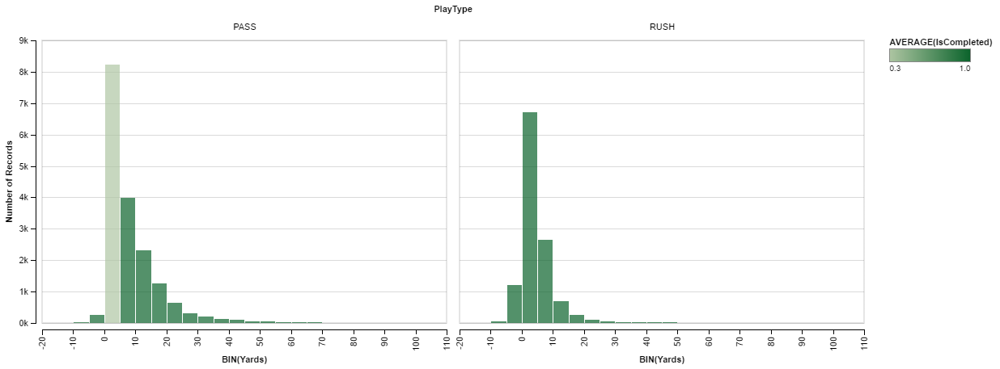

In [25]:
Chart(plays[plays['PlayType'].isin(['PASS', 'RUSH'])][['Yards', 'PlayType', 'IsCompleted']]).mark_bar().encode(
    x=X('Yards:Q', bin=Bin(maxbins=30)),
    y=Y('count(*):Q'),
    column='PlayType',
    color='average(IsCompleted)'
)

Pass plays can yield more yardage (and generally lead to less losses), but can be incomplete or intercepted. Besides these differences both distriubutions are shaped roughly the same:

In [26]:
plays[plays['PlayType'].isin(['PASS', 'RUSH'])].groupby('PlayType')[['Yards']].describe()

Yards
PlayType                    
PASS     count  17675.000000
         mean       7.382744
         std        9.965221
         min      -16.000000
         25%        0.000000
         50%        5.000000
         75%       11.000000
         max      100.000000
RUSH     count  11861.000000
         mean       4.197117
         std        6.345446
         min      -12.000000
         25%        1.000000
         50%        3.000000
         75%        6.000000
         max       85.000000